**Imstall && import lib**

In [ ]:
!pip install -q kaggle pydicom

     |████████████████████████████████| 1.9MB 6.5MB/s 


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pydicom as dicom
from PIL import Image

*Upload file authentication  && mount drivemount*

In [ ]:
from google.colab import files
files.upload()

{}

In [ ]:
!mkdir '/root/.kaggle'
!cp kaggle.json '/root/.kaggle'
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import matplotlib
matplotlib.use('TKAgg')

In [ ]:
cd /content/drive/MyDrive/nienluan

*Dowload **Dataset** (with 100 rows example - mutiple box
)* from kaggle



In [ ]:
!kaggle datasets download -d thanhphchunh/x-ray-dicom-100

 98% 885M/900M [00:07<00:00, 155MB/s]
100% 900M/900M [00:07<00:00, 129MB/s]


In [ ]:
!unzip -q x-ray-dicom-100.zip

# **Data Visualization**

*Raw data*

In [ ]:
train_df=pd.read_csv('/content/vinbigdata/train.csv')
train_df.sample(10)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
12997,682008cffca1751980b4010f4e82520d,Pleural thickening,11,R9,1517.0,450.0,1854.0,730.0
3767,0f91c90caeb1104e32750f538f729331,No finding,14,R6,NaN,NaN,NaN,NaN
60711,0007d316f756b3fa0baea2ff514ce945,Pulmonary fibrosis,13,R10,818.0,677.0,987.0,939.0
67784,995c671dc373b8d7347ce89d52e1f243,No finding,14,R4,NaN,NaN,NaN,NaN
7867,854079ff7c24d428b28fe5992c9f5a41,No finding,14,R7,NaN,NaN,NaN,NaN
29414,c58bc096aa929d9645f0a15a62771893,Infiltration,6,R8,688.0,685.0,935.0,1113.0
60850,d75fb72a8a880dc60400214b5883da75,No finding,14,R4,NaN,NaN,NaN,NaN
54563,bd3fe876153eeddad8bab49b129ea081,Lung Opacity,7,R9,1446.0,733.0,1817.0,1063.0
14682,7c6f191b5d28bc1992e491d906f0d1a5,Aortic enlargement,0,R8,1452.0,867.0,1721.0,1245.0
41655,0453de2faeb8d349af739a68d9dee1cb,Nodule/Mass,8,R10,1573.0,1486.0,1674.0,1595.0


*classes*

In [ ]:
class_sample_counts=train_df.groupby(['class_name','class_id']).size().reset_index().rename(columns={0:'count'})
class_sample_counts.sort_values(by='class_id',inplace=True)
class_sample_counts.reset_index(drop=True)

,class_name,class_id,count
0,Aortic enlargement,0,7162
1,Atelectasis,1,279
2,Calcification,2,960
3,Cardiomegaly,3,5427
4,Consolidation,4,556
5,ILD,5,1000
6,Infiltration,6,1247
7,Lung Opacity,7,2483
8,Nodule/Mass,8,2580
9,Other lesion,9,2203


Class name

In [ ]:
class_name=list((class_sample_counts['class_name']))
print(f'The total number of classes is {len(class_name)}')
print(class_name)

The total number of classes is 15
['Aortic enlargement', 'Atelectasis', 'Calcification', 'Cardiomegaly', 'Consolidation', 'ILD', 'Infiltration', 'Lung Opacity', 'Nodule/Mass', 'Other lesion', 'Pleural effusion', 'Pleural thickening', 'Pneumothorax', 'Pulmonary fibrosis', 'No finding']


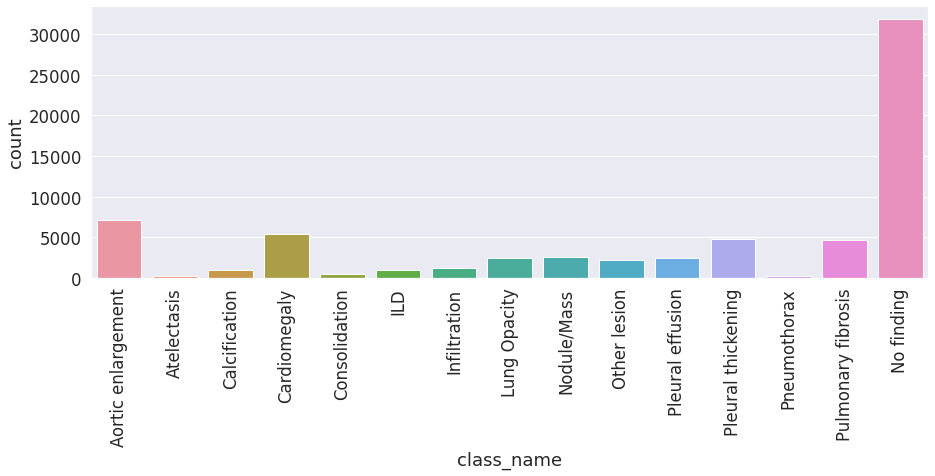

In [ ]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.5)
g=sns.barplot(x='class_name',y='count',data=class_sample_counts)
g=g.set_xticklabels(g.get_xticklabels(), rotation=90)

Visualization of bounding box area of each disease class

In [ ]:
train_df_abnormal=train_df[train_df['class_id']!=14].reset_index(drop=True)
train_df_abnormal

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0
...,...,...,...,...,...,...,...,...
36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0
36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0
36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0
36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0


In [ ]:
train_df_abnormal['area']=(train_df_abnormal['x_max']-train_df_abnormal['x_min'])*(train_df_abnormal['y_max']-train_df_abnormal['y_min'])

In [ ]:
class_wise_area=train_df_abnormal.groupby(['class_name','class_id'])['area'].mean().reset_index()
class_wise_area

,class_name,class_id,area
0,Aortic enlargement,0,111786.365820
1,Atelectasis,1,392763.050179
2,Calcification,2,92550.651042
3,Cardiomegaly,3,430588.274553
4,Consolidation,4,325284.230216
5,ILD,5,653507.925000
6,Infiltration,6,343015.942261
7,Lung Opacity,7,251134.065244
8,Nodule/Mass,8,73546.351163
9,Other lesion,9,259795.801180


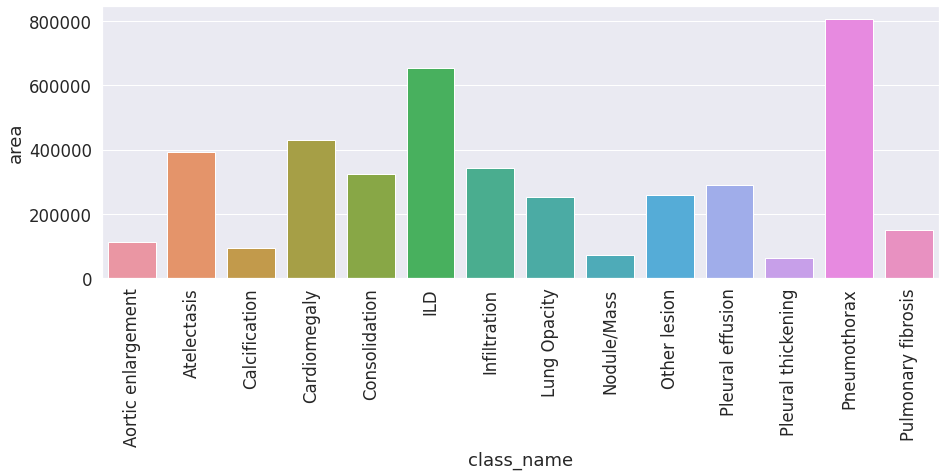

In [ ]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.5)
g=sns.barplot(x='class_name',y='area',data=class_wise_area)
g=g.set_xticklabels(g.get_xticklabels(), rotation=90)

In [ ]:
train_df_abnormal.drop('area',axis=1)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0
...,...,...,...,...,...,...,...,...
36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0
36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0
36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0
36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0


Data Processing

*load data set width & height*

In [ ]:
train_df = pd.read_csv('/content/train512.csv')
train_df

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332.0,2580.0
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954.0,3159.0
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080.0,2336.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304.0,2880.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540.0,3072.0
...,...,...,...,...,...,...,...,...,...,...
13365,bdd7f0b920e6c5ea82526986ffb63001,Pleural effusion,10,R10,1888.0,1742.0,1982.0,1884.0,2048.0,2500.0
13366,7c22cee85ef4ace76782964772819043,Aortic enlargement,0,R9,1133.0,1012.0,1495.0,1456.0,2304.0,2880.0
13367,b7cb4aab02fe2cdcf2de5b7a93f49d73,Pulmonary fibrosis,13,R11,1480.0,729.0,1875.0,1232.0,2228.0,2507.0
13368,1caa3fd2d741bbb50cc3fdcc32b6f0cd,Nodule/Mass,8,R10,449.0,1062.0,769.0,1257.0,2630.0,2873.0


In [ ]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)
train_df

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080.0,2336.0
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304.0,2880.0
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,2540.0,3072.0
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2285.0,2555.0
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,2568.0,3353.0
...,...,...,...,...,...,...,...,...,...,...
7073,bdd7f0b920e6c5ea82526986ffb63001,Pleural effusion,10,R10,1888.0,1742.0,1982.0,1884.0,2048.0,2500.0
7074,7c22cee85ef4ace76782964772819043,Aortic enlargement,0,R9,1133.0,1012.0,1495.0,1456.0,2304.0,2880.0
7075,b7cb4aab02fe2cdcf2de5b7a93f49d73,Pulmonary fibrosis,13,R11,1480.0,729.0,1875.0,1232.0,2228.0,2507.0
7076,1caa3fd2d741bbb50cc3fdcc32b6f0cd,Nodule/Mass,8,R10,449.0,1062.0,769.0,1257.0,2630.0,2873.0


In [ ]:
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

train_df['w'] = train_df.apply(lambda row: (row.x_max-row.x_min), axis =1)
train_df['h'] = train_df.apply(lambda row: (row.y_max-row.y_min), axis =1)

train_df['area'] = train_df['w']*train_df['h']
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080.0,2336.0,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304.0,2880.0,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540.0,3072.0,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285.0,2555.0,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568.0,3353.0,0.239875,0.721145,0.045950,0.039368,0.001809


In [ ]:
features = ['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h', 'area']
X = train_df[features]
y = train_df['class_id']
X.shape, y.shape

((7078, 9), (7078,))

In [ ]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

*t-SNE Visualization*

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, perplexity = 40, random_state=1, n_iter=5000)
data_X = X
data_y = y.loc[data_X.index]
embs = tsne.fit_transform(data_X)
# Add to dataframe for convenience
plot_x = embs[:, 0]
plot_y = embs[:, 1]

In [ ]:
embs

array([[-168.84013 ,   16.392515],
       [  83.9556  ,   32.81377 ],
       [ -40.293243,  142.98256 ],
       ...,
       [ -81.40512 ,   -4.440496],
       [ -65.30012 ,  -55.539383],
       [-128.59601 ,  -27.26285 ]], dtype=float32)

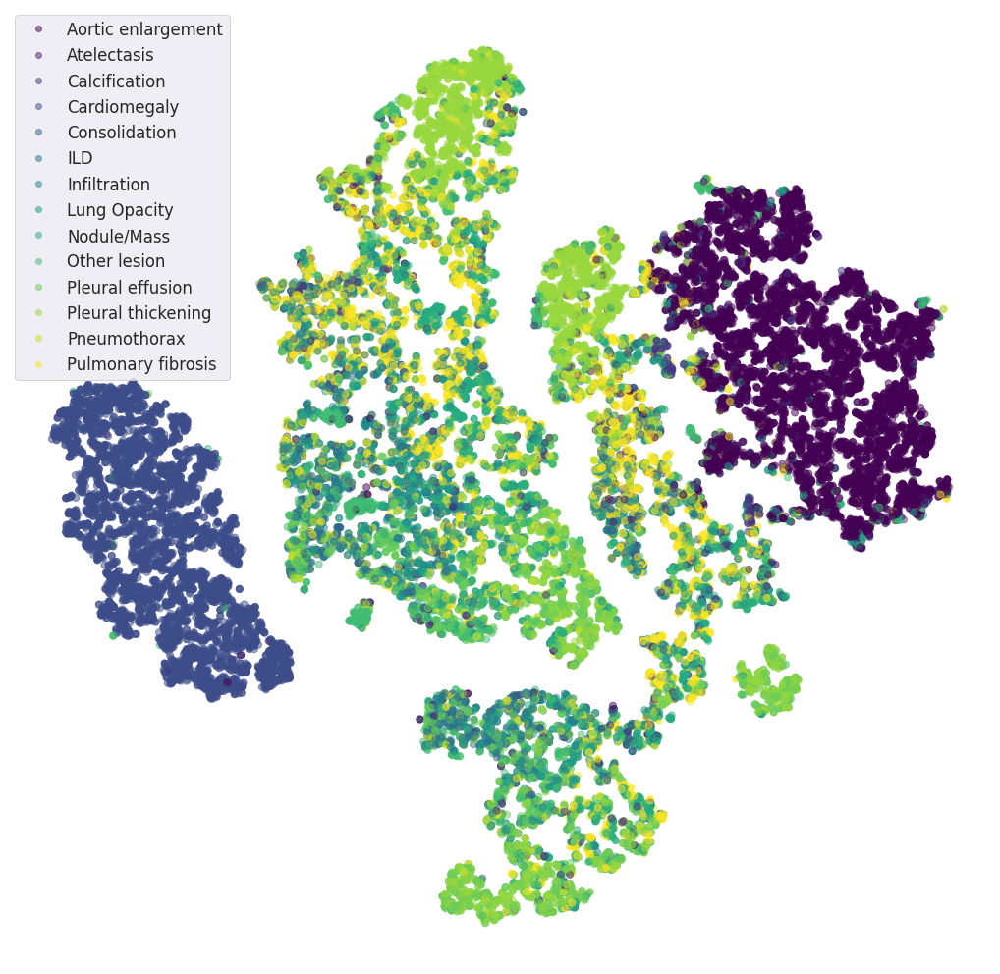

In [ ]:
plt.figure(figsize = (18, 18))
plt.axis('off')
scatter = plt.scatter(plot_x, plot_y, marker = 'o',s = 50, c=data_y.tolist(), alpha= 0.5,cmap='viridis')
plt.legend(handles=scatter.legend_elements()[0], labels=classes)

# Read Dicom

*list file Dicom*

In [ ]:
arr = os.listdir('/content/vinbigdata/')
print(list(arr))

['c699f16ba0b86f474390da9515bcad7a.dicom', 'f233f426d24061d9584932e52bfdbd49.dicom', '1aef7fa409ee0cb4579032577e02e9cb.dicom', '1b2a7adb5705d9e3f5b63939046d93c7.dicom', '6b6f79dad019a4dee92fa35456f75a48.dicom', 'dfd523a5991fc852654bf1235c6282c6.dicom', '9255e7154b30dcddd72f1f5ae6e46470.dicom', '27b822c5d3b354f096dfb788fd3fa636.dicom', 'c6c19cc8f966c6353e663a4e299d9a39.dicom', 'f2c0995bf613672b13eb82ee09b1547b.dicom', '6c35a010256b29d6db4956f5bffff4a2.dicom', 'ce5e76544b8c1d0ec34783b0f1bc471d.dicom', 'e62c07fde352cc658af3f989fe0b546f.dicom', '22672ab82c290c20b86863291e25ef6c.dicom', 'd106ec9b305178f3da060efe3191499a.dicom', '58c96358e94c768b0eeb723bf985d575.dicom', '11b3a0fe7f25bbe7643c60bcb14c35f5.dicom', '5268b1ff61505e50ac05fd430cc45276.dicom', 'train.csv', '89e6ab133f587191383608ee04cea79a.dicom', '0b0e106a53f9dc3b28a9b15f94510b7a.dicom', '03e6ecfa6f6fb33dfeac6ca4f9b459c9.dicom', '23c9516db65572bae3125bcaead302d3.dicom', 'a2d8804d3d08a2afb75dd9e6fbb53010.dicom', '7d0e636b3ef2ccbb0c6

In [ ]:
image_id_index  =np.random.randint(low=0,high=len(arr),size=1)
image_id_index

array([74])

In [ ]:
train_df1=train_df_abnormal.iloc[image_id_index[0]]
train_df1=train_df_abnormal[train_df_abnormal['image_id']+'.dicom'==arr[image_id_index[0]]]
train_df1.reset_index()

,index,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,area
0,98,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,713.0,1634.0,791.0,1695.0,4758.0
1,1655,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,474.0,1552.0,541.0,1603.0,3417.0
2,1720,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,1974.0,1270.0,2063.0,1342.0,6408.0
3,3142,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,488.0,901.0,544.0,960.0,3304.0
4,8045,15c3fc505c414c69ba757cb3be3ed213,Pleural thickening,11,R10,883.0,241.0,1154.0,349.0,29268.0
5,9078,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,708.0,1066.0,781.0,1134.0,4964.0
6,11167,15c3fc505c414c69ba757cb3be3ed213,Aortic enlargement,0,R8,1350.0,602.0,1782.0,1011.0,176688.0
7,12491,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R9,481.0,1541.0,554.0,1619.0,5694.0
8,14603,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R9,1989.0,1279.0,2060.0,1348.0,4899.0
9,15034,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,1688.0,1151.0,1790.0,1214.0,6426.0


In [ ]:
rad_ids = list(np.array(train_df1['rad_id'])[np.argsort(train_df1['rad_id'])])
rad_ids = list(dict.fromkeys(rad_ids))
rad_ids

['R10', 'R8', 'R9']

In [ ]:
for i in rad_ids:
    print(train_df1[train_df1['rad_id']==i])

                               image_id          class_name  ...   y_max      area
1655   15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1603.0    3417.0
3142   15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...   960.0    3304.0
8045   15c3fc505c414c69ba757cb3be3ed213  Pleural thickening  ...   349.0   29268.0
15034  15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1214.0    6426.0
22134  15c3fc505c414c69ba757cb3be3ed213  Aortic enlargement  ...   946.0  124092.0
34619  15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1338.0    4680.0

[6 rows x 9 columns]
                               image_id          class_name  ...   y_max      area
98     15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1695.0    4758.0
1720   15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1342.0    6408.0
9078   15c3fc505c414c69ba757cb3be3ed213         Nodule/Mass  ...  1134.0    4964.0
11167  15c3fc505c414c69ba757cb3be3ed213  Aortic enlargement  ... 

In [ ]:
dicom_image=dicom.dcmread(os.path.join('/content/vinbigdata/',arr[image_id_index[0]]))  
pixel_data_raw = dicom_image
pixel_data_raw 

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 160
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Digital X-Ray Image Storage - For Presentation
(0002, 0003) Media Storage SOP Instance UID      UI: 15c3fc505c414c69ba757cb3be3ed213
(0002, 0010) Transfer Syntax UID                 UI: JPEG 2000 Image Compression (Lossless Only)
(0002, 0012) Implementation Class UID            UI: 1.2.3.4
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0010, 0040) Patient's Sex                       CS: 'M'
(0010, 1010) Patient's Age                       AS: '081Y'
(0028, 0002) Samples per Pixel                   US: 1
(0028, 0004) Photometric Interpretation          CS: 'MONOCHROME2'
(0028, 0010) Rows                                US: 2868
(0028, 0011) Columns                             US: 2620
(0028, 0

/usr/local/lib/python3.7/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:177: UserWarning: The (0028,0101) 'Bits Stored' value (14-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  f"The (0028,0101) 'Bits Stored' value ({ds.BitsStored}-bit) "


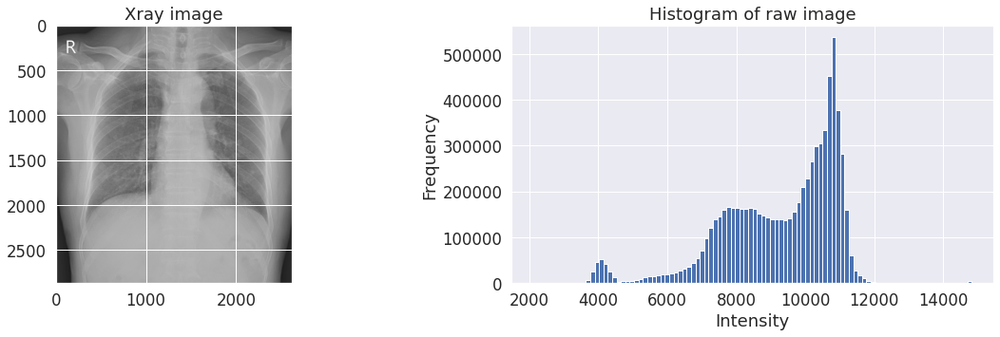

In [ ]:
pixel_data = dicom_image.pixel_array   
pi = dicom_image['PhotometricInterpretation'].value
if pi == 'MONOCHROME1':
    pixel_data = np.abs(pixel_data.max()- pixel_data) 
plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.title('Xray image')
plt.imshow(pixel_data,'gray')
plt.subplot(1,2,2)
plt.title('Histogram of raw image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
g=plt.hist(pixel_data.ravel(),bins=100)

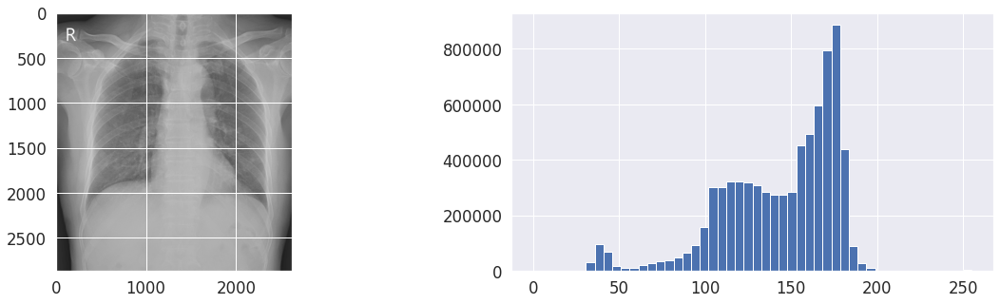

In [ ]:
pixel_data_norm=pixel_data.copy()
cv2.normalize(pixel_data, pixel_data_norm, 0, 255, cv2.NORM_MINMAX)
plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.imshow(pixel_data_norm,'gray')
plt.subplot(1,2,2)
g=plt.hist(pixel_data_norm.ravel(),bins=50)

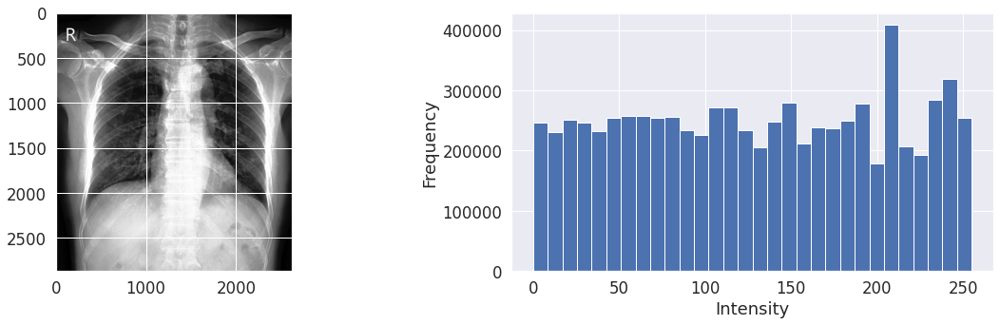

In [ ]:
pixel_data_norm1=np.asarray(pixel_data_norm,np.uint8)
pixel_data_norm1=cv2.equalizeHist(pixel_data_norm1)
plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.imshow(pixel_data_norm1,'gray')
plt.subplot(1,2,2)
plt.xlabel('Intensity')
plt.ylabel('Frequency')
g=plt.hist(pixel_data_norm1.ravel(),bins=30)

resize and save

In [ ]:
def resize(array, size, keep_ratio=False, resample=Image.LANCZOS):
    # Original from: https://www.kaggle.com/xhlulu/vinbigdata-process-and-resize-to-image
    im = Image.fromarray(array)
    
    if keep_ratio:
        im.thumbnail((size, size), resample)
    else:
        im = im.resize((size, size), resample)
    return im

In [ ]:
dicom_image=dicom.dcmread(os.path.join('/content/vinbigdata/',arr[image_id_index[0]]))  
pixel_data = dicom_image.pixel_array

/usr/local/lib/python3.7/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:177: UserWarning: The (0028,0101) 'Bits Stored' value (14-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  f"The (0028,0101) 'Bits Stored' value ({ds.BitsStored}-bit) "


In [ ]:
data_voi = pixel_data
pixel_data

array([[4393, 4416, 4396, ..., 4202, 4187, 4189],
       [4390, 4413, 4393, ..., 4198, 4182, 4184],
       [4387, 4408, 4390, ..., 4192, 4177, 4180],
       ...,
       [4537, 4535, 4531, ..., 4346, 4304, 4341],
       [4536, 4534, 4534, ..., 4345, 4304, 4341],
       [4537, 4536, 4539, ..., 4346, 4308, 4345]], dtype=uint16)

In [ ]:
data_voi = data_voi - np.min(data_voi)
data_voi = data_voi / np.max(data_voi)
data_voi = (data_voi * 255).astype(np.uint8)
data_voi.shape

(2868, 2620)

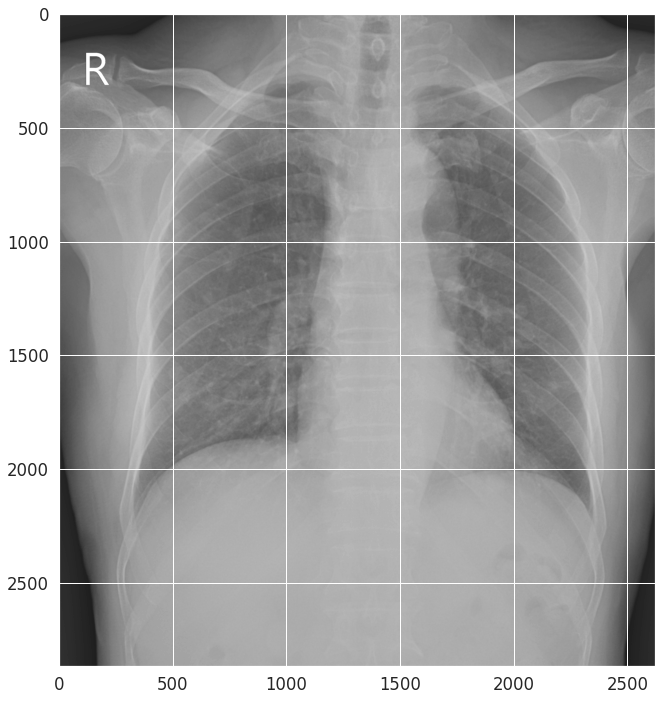

In [ ]:
plt.figure(figsize = (12,12))

# plt.figure(figsize = (12,12))
# plt.imshow(resize(data_voi,512), 'gray')
filename = 'savedImage.jpg'
plt.imshow(data_voi, 'gray')

In [ ]:
cv2.imwrite(filename, pixel_data_norm1)
cv2.imwrite('filename.jpg', pixel_data_norm1)

True

Fusing box

In [ ]:
df_train = pd.read_csv('/content/train512.csv')
test_df = df_train[df_train['image_id'] == arr[image_id_index[0]].split('.')[0]]
test_df.reset_index()

,index,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,174,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,713.0,1634.0,791.0,1695.0,2620,2868
1,3101,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,474.0,1552.0,541.0,1603.0,2620,2868
2,3231,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,1974.0,1270.0,2063.0,1342.0,2620,2868
3,5980,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,488.0,901.0,544.0,960.0,2620,2868
4,15195,15c3fc505c414c69ba757cb3be3ed213,Pleural thickening,11,R10,883.0,241.0,1154.0,349.0,2620,2868
5,17181,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R8,708.0,1066.0,781.0,1134.0,2620,2868
6,21151,15c3fc505c414c69ba757cb3be3ed213,Aortic enlargement,0,R8,1350.0,602.0,1782.0,1011.0,2620,2868
7,23658,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R9,481.0,1541.0,554.0,1619.0,2620,2868
8,27625,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R9,1989.0,1279.0,2060.0,1348.0,2620,2868
9,28426,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,R10,1688.0,1151.0,1790.0,1214.0,2620,2868


In [ ]:
lables =[
    "Aortic enlargement",
    "Atelectasis",
    "Calcification",
    "Cardiomegaly",
    "Consolidation",
    "ILD",
    "Infiltration",
    "Lung Opacity",
    "Nodule/Mass",
    "Other lesion",
    "Pleural effusion",
    "Pleural thickening",
    "Pneumothorax",
    "Pulmonary fibrosis"
]
label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]
def draw_bbox(img_id, df,numColor=0):
    # print(df)
    # image_path = PATH_FOLDER + img_id + '.jpg'
    image_path = img_id
    alpha = 0.1
    alpha_box = 0.5
    img = cv2.imread(image_path)
    # img = resize(img,1024)
    dh, dw,_ = img.shape # ex (960, 768, 3)
    overlay_bbox = img.copy()
    for i,y in df.iterrows():
        # print(lables.index(y['class_name']))
        overlay_bbox = img.copy()
        class_name = y['class_name']
        l = int(y['x_min']*dw/y['width'])
        r = int(y['x_max']*dw/y['width'])
        t = int(y['y_min']*dh/y['height'])
        b = int(y['y_max']*dh/y['height'])
        colors=label2color[lables.index(y['class_name'])]
        # color = (colors[0],colors[1],colors[2])
        color = (0, 255, 0) if numColor == 0 else (label2color[numColor][0],label2color[numColor][1],label2color[numColor][2])
        cv2.putText(img, class_name, (l, t), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)
        cv2.rectangle(overlay_bbox,(l, t), (r, b),color, -1)
        cv2.addWeighted(overlay_bbox, alpha, img, 1 - alpha, 0, img)

        cv2.rectangle(img, (l, t), (r, b), color, 2)
    return img

In [ ]:
imgOriginal = draw_bbox('/content/savedImage.jpg', test_df)

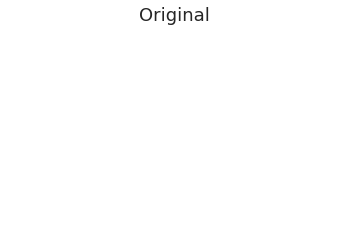

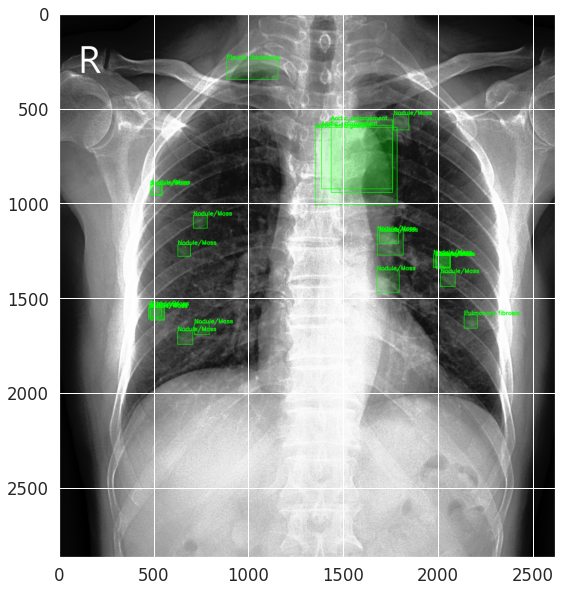

In [ ]:
plt.axis('off')
plt.title("Original")
plt.figure(figsize = (10,10))
plt.imshow(imgOriginal)

**bb_intersection_over_union**

In [ ]:
def bb_intersection_over_union(boxA, boxB):
   # determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
#     Consider a 1D example :
# - 2 points : x1 = 1 and x2 = 3, the distance is indeed x2-x1 = 2
# - 2 pixels of index : i1 = 1 and i2 = 3, the segment from pixel i1 to i2 contains 3 pixels ie l = i2 - i1 + 1
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

def averageCoordinates(df,threshold):
    tmp_df = df.reset_index() # 0 1 2 3 
    duplicate = {}
    for index1, row1 in tmp_df.iterrows():
        if index1 < len(tmp_df) -1 :
            nextIndex = index1 + 1
            for index2, row2 in tmp_df.loc[nextIndex:,:].iterrows():
                if row1['class_id'] == row2['class_id']:
                    boxA = [row1['x_min'], row1['y_min'], row1['x_max'], row1['y_max']]
                    boxB = [row2['x_min'], row2['y_min'], row2['x_max'], row2['y_max']]
                    iou = bb_intersection_over_union(boxA, boxB)
                    print("class_id", row1["class_id"])
                    print("iou", iou)
                    if iou > threshold:
                        if row1["index"] not in duplicate:
                            duplicate[row1["index"]] = []
                        duplicate[row1["index"]].append(row2["index"])
    remove_keys = []

    for k in duplicate:
        for i in duplicate[k]:
            if i in duplicate:
                for id in duplicate[i]:
                    if id not in duplicate[k]:
                        duplicate[k].append(id)
                if i not in remove_keys:
                    remove_keys.append(i)
    # print(remove_keys)
    for i in remove_keys:
        del duplicate[i]

    rows = []
    removed_index = []
    for k in duplicate:
        row = tmp_df[tmp_df['index'] == k].iloc[0]
        X_min = [row['x_min']]
        X_max = [row['x_max']]
        Y_min = [row['y_min']]
        Y_max = [row['y_max']]
        removed_index.append(k)
        for i in duplicate[k]:
            removed_index.append(i)
            row = tmp_df[tmp_df['index'] == i].iloc[0]
            X_min.append(row['x_min'])
            X_max.append(row['x_max'])
            Y_min.append(row['y_min'])
            Y_max.append(row['y_max'])
        X_min_avg = sum(X_min) / len(X_min)
        X_max_avg = sum(X_max) / len(X_max)
        Y_min_avg = sum(Y_min) / len(Y_min)
        Y_max_avg = sum(Y_max) / len(Y_max)
        new_row = [row['image_id'], row['class_name'], row['class_id'], X_min_avg, Y_min_avg, X_max_avg, Y_max_avg, row['width'], row['height']]
        rows.append(new_row)

    for index, row in tmp_df.iterrows():
        if row['index'] not in removed_index:
            new_row = [row['image_id'], row['class_name'], row['class_id'], row['x_min'], row['y_min'], row['x_max'], row['y_max'], row['width'], row['height']]
            rows.append(new_row)

    new_df = pd.DataFrame(rows, columns =['image_id', 'class_name', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max', 'width', 'height'])
    return new_df

In [ ]:
new_df = averageCoordinates(test_df,0.5)
new_df

class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.5107890499194847
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.6577380952380952
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.6580976863753213
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.7334855403348554
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 8
iou 0.0
class_id 

,image_id,class_name,class_id,x_min,y_min,x_max,y_max,width,height
0,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,475.666667,1547.666667,550.000000,1611.666667,2620,2868
1,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,1982.000000,1275.666667,2061.333333,1342.666667,2620,2868
2,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,484.000000,903.000000,542.000000,958.500000,2620,2868
3,15c3fc505c414c69ba757cb3be3ed213,Aortic enlargement,0,1389.000000,585.333333,1766.333333,961.333333,2620,2868
4,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,713.000000,1634.000000,791.000000,1695.000000,2620,2868
5,15c3fc505c414c69ba757cb3be3ed213,Pleural thickening,11,883.000000,241.000000,1154.000000,349.000000,2620,2868
6,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,708.000000,1066.000000,781.000000,1134.000000,2620,2868
7,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,1688.000000,1151.000000,1790.000000,1214.000000,2620,2868
8,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,1677.000000,1144.000000,1814.000000,1276.000000,2620,2868
9,15c3fc505c414c69ba757cb3be3ed213,Nodule/Mass,8,2011.000000,1369.000000,2088.000000,1442.000000,2620,2868


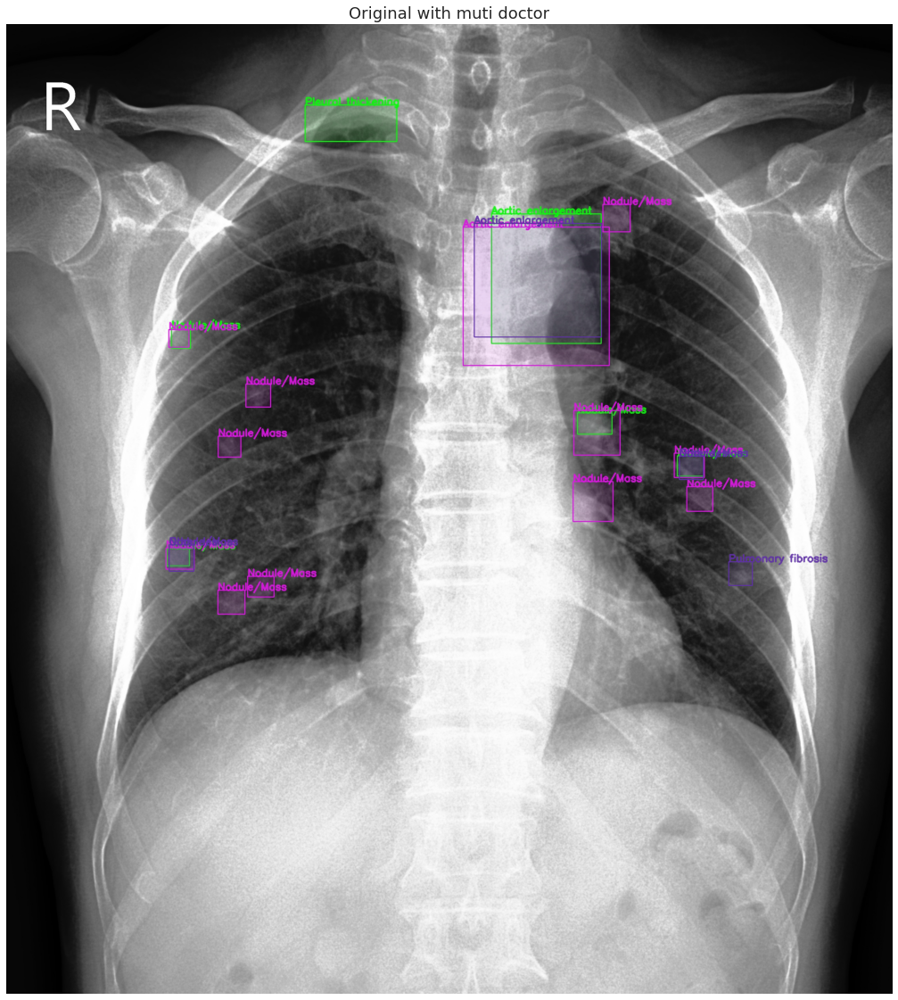

In [ ]:
for i in range(0,len(rad_ids)):
    imgDoctor = draw_bbox('/content/filename.jpg', test_df[test_df['rad_id']==rad_ids[i]],numColor = i);
    cv2.imwrite('filename.jpg', imgDoctor)   
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.title("Original with muti doctor")
plt.imshow(imgDoctor)                                                      

In [ ]:
imgIOU = draw_bbox('/content/savedImage.jpg', new_df)

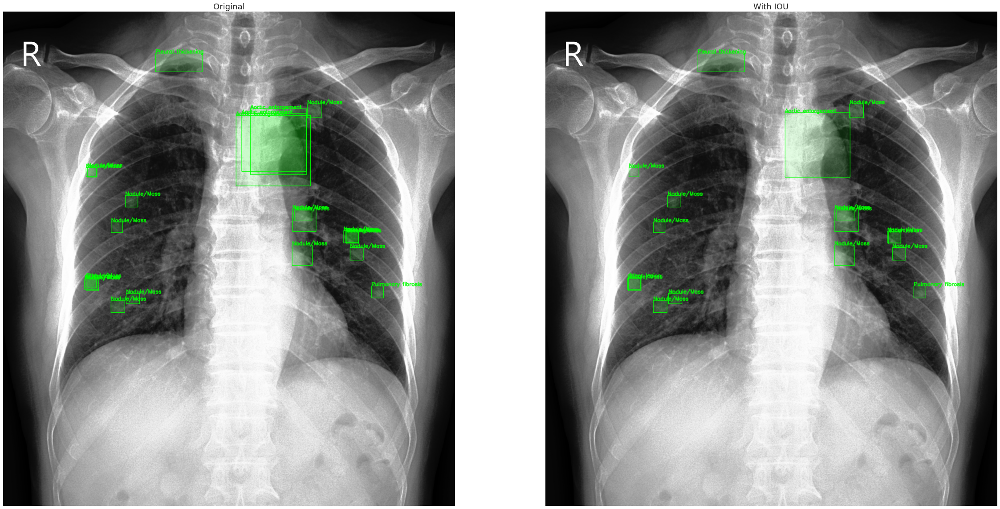

In [ ]:
rows = 1
columns = 2 
fig = plt.figure(figsize=(40, 40))
fig.add_subplot(rows, columns,1) 
plt.imshow(imgOriginal)
plt.axis('off')
plt.title("Original")
fig.add_subplot(rows, columns,2)
plt.axis('off')
plt.title("With IOU")
plt.imshow(imgIOU)

#training

In [ ]:
!kaggle datasets download -d awsaf49/vinbigdata-1024-image-dataset

100% 8.14G/8.14G [02:08<00:00, 57.9MB/s]
100% 8.14G/8.14G [02:08<00:00, 67.8MB/s]


In [ ]:
!unzip -q vinbigdata-1024-image-dataset.zip

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/xray100/vinbigdata/train.csv')
df_train

In [ ]:
#add 2 class ['No Finding and Finding']
labels = [
    "Aortic enlargement",
    "Atelectasis",
    "Calcification",
    "Cardiomegaly",
    "Consolidation",
    "ILD",
    "Infiltration",
    "Lung Opacity",
    "Nodule/Mass",
    "Other lesion",
    "Pleural effusion",
    "Pleural thickening",
    "Pneumothorax",
    "Pulmonary fibrosis",
    "No finding",
    "Finding"
]

In [ ]:
images_lst = df_train.groupby('image_id').apply(list).reset_index()['image_id'].tolist()
images_dir = '/content/vinbigdata/train/'
 
# Add class_id=14 and class_id=15
frames = []
for img_id in images_lst:
    sub_df = df_train[df_train['image_id'] == img_id].reset_index()
    sub_df = averageCoordinates(sub_df,  0.5)
    frames.append(sub_df)
    rows = []
    if int(sub_df["class_id"][0]) == 14:
        rows.append("14 0.5 0.5 1.0 1.0")
    else:
        for index, row in sub_df.iterrows():
            w = int(row["width"])
            h = int(row["height"])
            cx = (int(row["x_min"]) + int(row["x_max"])) / 2 / w
            cy = (int(row["y_min"]) + int(row["y_max"])) / 2 / h
            bw = (int(row["x_max"]) - int(row["x_min"])) / w
            bh = (int(row["y_max"]) - int(row["y_min"])) / h
            row = [str(row["class_id"]), str(cx), str(cy), str(bw), str(bh)]
            rows.append(" ".join(row))
        rows.append("15 0.5 0.5 1.0 1.0")
    f = open(images_dir + img_id + ".txt", "w")
    f.write("\n".join(rows))
    f.close()
 
new_df = pd.concat(frames)
new_df.to_csv('/content/new_train.csv', index=False)

In [ ]:
df_train_new = pd.read_csv('/content/new_train.csv')
df_train_new

,image_id,class_name,class_id,x_min,y_min,x_max,y_max,width,height
0,000434271f63a053c4128a0ba6352c7f,No finding,14,NaN,NaN,NaN,NaN,2336,2836
1,000434271f63a053c4128a0ba6352c7f,No finding,14,NaN,NaN,NaN,NaN,2336,2836
2,000434271f63a053c4128a0ba6352c7f,No finding,14,NaN,NaN,NaN,NaN,2336,2836
3,00053190460d56c53cc3e57321387478,No finding,14,NaN,NaN,NaN,NaN,1994,2430
4,00053190460d56c53cc3e57321387478,No finding,14,NaN,NaN,NaN,NaN,1994,2430
...,...,...,...,...,...,...,...,...,...
55631,fff0f82159f9083f3dd1f8967fc54f6a,No finding,14,NaN,NaN,NaN,NaN,2048,2500
55632,fff0f82159f9083f3dd1f8967fc54f6a,No finding,14,NaN,NaN,NaN,NaN,2048,2500
55633,fff2025e3c1d6970a8a6ee0404ac6940,No finding,14,NaN,NaN,NaN,NaN,1994,2150
55634,fff2025e3c1d6970a8a6ee0404ac6940,No finding,14,NaN,NaN,NaN,NaN,1994,2150


In [ ]:
arr = os.listdir('/content/vinbigdata/train/')
print(len(list(arr)),list(arr))

30000 ['a537060564b5e08c80f46362deb565e8.png', '99f0eb28d23da4f89f835f8e5dbf815f.png', '1049692f29ed7540074d4b0b623cae6e.png', 'a657a8af7862982643a765365d051f81.png', '61fee17f99b29fc46130613d0e7ba7c2.png', 'aa47b9a61e0440f6a82c46f57b07cb6a.png', '5c930287c9f13ff6e1218693fe70dd92.png', 'f57499c072f081f12ce8006e81a20d74.png', 'f2f8d46d9438459a795b19be73738cbb.png', 'd5fd5c2233862d3d73a5e4f7b57be280.png', '817156a6b23080b1a200ec0b0a2f36c2.png', 'aa1758ce7d9f3cb0bbba72d163ffc69a.png', 'e89790c02bea2b743ea1bf4ee5d7339b.png', '32d7d0b779485be0f92e8ef0f90cccdf.txt', '641968ae3a4233add5aac188531b6727.txt', '25c3e8d473ae41bff1a294abfa850615.png', '76f9ba9dfd4eee882b68e671977ce16d.png', '0be5a5e29dc5f2198fbe447697fb3c95.png', '3124a602cb56b2a41271a8b658410457.txt', '76a8a1a491e23dc44e0c33654f10c632.txt', '547540df8b3a25088abd283ed6330e67.png', '0506ee0b2a39c2caf6685ee72ebabb9e.png', 'b7d001b6aa0043b31684a9c0d65e212b.png', 'e5ac3f7d0b2de93893dc3515490088f8.png', '20895c96139e8c3af0ca53e7f872ea97

In [ ]:
s_id = arr[image_id_index[0]].split('.')[0]

In [ ]:
matching = [s for s in arr if s_id in s]
matching

['a537060564b5e08c80f46362deb565e8.png',
 'a537060564b5e08c80f46362deb565e8.txt']

13 0.3310546875 0.22347005208333334 0.059895833333333336 0.1435546875
13 0.6258138020833334 0.20572916666666666 0.0498046875 0.14453125
13 0.31103515625 0.3595377604166667 0.18977864583333334 0.13509114583333334
5 0.6722005208333334 0.57275390625 0.17122395833333334 0.3942057291666667
13 0.3194986979166667 0.54638671875 0.07649739583333333 0.1611328125
11 0.16341145833333334 0.7931315104166666 0.0546875 0.07845052083333333
11 0.19010416666666666 0.8011067708333334 0.09830729166666667 0.06640625
10 0.16341145833333334 0.7931315104166666 0.0546875 0.07845052083333333
9 0.3084309895833333 0.26123046875 0.2516276041666667 0.3134765625
11 0.3653971354166667 0.134765625 0.1357421875 0.037760416666666664
9 0.24072265625 0.6393229166666666 0.2138671875 0.2858072916666667
9 0.453125 0.5152994791666666 0.12174479166666667 0.3541666666666667
11 0.6251627604166666 0.13134765625 0.07649739583333333 0.0263671875
12 0.3084309895833333 0.26123046875 0.2516276041666667 0.3134765625
12 0.24072265625 0.6

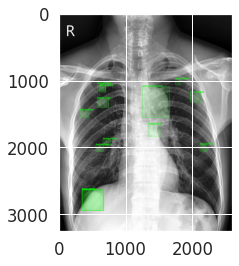

In [ ]:
f = open('/content/vinbigdata/train/a537060564b5e08c80f46362deb565e8.txt', 'r')
print(f.read())
plt.imshow(imgIOU)

In [ ]:
from sklearn.tr import train_test_split
 
df_train = pd.read_csv('/content/new_train.csv')
train, val = train_test_split(df_train, test_size=0.2)
 
train_images_lst = train.groupby('image_id').apply(list).reset_index()['image_id'].tolist()
val_images_lst = val.groupby('image_id').apply(list).reset_index()['image_id'].tolist()
 
def createImagesTxt(_images, filepath):
    images_dir = '/content/vinbigdata/train/'
    rows = []
    for img_id in _images:
        rows.append(images_dir + img_id + '.png')
    f = open(filepath, "w")
    f.write("\n".join(rows))
    f.close()
 
 
train_path = '/content/train.txt'
val_path = '/content/val.txt'
createImagesTxt(train_images_lst, train_path)
createImagesTxt(val_images_lst, val_path)

In [ ]:
train_images_lst[:10],len(train_images_lst),val_images_lst[:10],len(val_images_lst)

(['000434271f63a053c4128a0ba6352c7f',
  '00053190460d56c53cc3e57321387478',
  '0005e8e3701dfb1dd93d53e2ff537b6e',
  '0006e0a85696f6bb578e84fafa9a5607',
  '0007d316f756b3fa0baea2ff514ce945',
  '000ae00eb3942d27e0b97903dd563a6e',
  '000d68e42b71d3eac10ccc077aba07c1',
  '00150343289f317a0ad5629d5b7d9ef9',
  '00176f7e1b1cb835123f95960b9a9efd',
  '001d127bad87592efe45a5c7678f8b8d'],
 14832,
 ['0006e0a85696f6bb578e84fafa9a5607',
  '0007d316f756b3fa0baea2ff514ce945',
  '000d68e42b71d3eac10ccc077aba07c1',
  '00150343289f317a0ad5629d5b7d9ef9',
  '001d127bad87592efe45a5c7678f8b8d',
  '00291f7aff0123ea76a59998effef229',
  '003cfe5ce5c0ec5163138eb3b740e328',
  '0046f681f078851293c4e710c4466058',
  '00575e3846ebd05a909d97ba59c53d30',
  '0061cf6d35e253b6e7f03940592cc35e'],
 7882)

In [ ]:
!rm -f /content/config.yaml
!echo "train: /content/train.txt" >> /content/config.yaml
!echo "val: /content/val.txt" >> /content/config.yaml
!echo "nc: 16" >> /content/config.yaml
!echo "names: ['Aortic enlargement','Atelectasis','Calcification','Cardiomegaly','Consolidation','ILD','Infiltration','Lung Opacity','Nodule/Mass','Other lesion','Pleural effusion','Pleural thickening','Pneumothorax','Pulmonary fibrosis','No finding','Finding']" >> /content/config.yaml

In [ ]:
f = open('/content/config.yaml', 'r')
print(f.read())

train: /content/train.txt
val: /content/val.txt
nc: 16
names: ['Aortic enlargement','Atelectasis','Calcification','Cardiomegaly','Consolidation','ILD','Infiltration','Lung Opacity','Nodule/Mass','Other lesion','Pleural effusion','Pleural thickening','Pneumothorax','Pulmonary fibrosis','No finding','Finding']



# Training with 100

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data /content/config.yaml --weights yolov5x.pt

In [ ]:
!python train.py --resume

github: ⚠️ WARNING: code is out of date by 10 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
Resuming training from ./runs/train/exp/weights/last.pt
YOLOv5 🚀 v4.0-150-g1620669 torch 1.8.0+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='', data='/content/config.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=True, save_dir='runs/train/exp', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='./runs/train/exp/weights/last.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train

# **Result**

Class *Distribution*

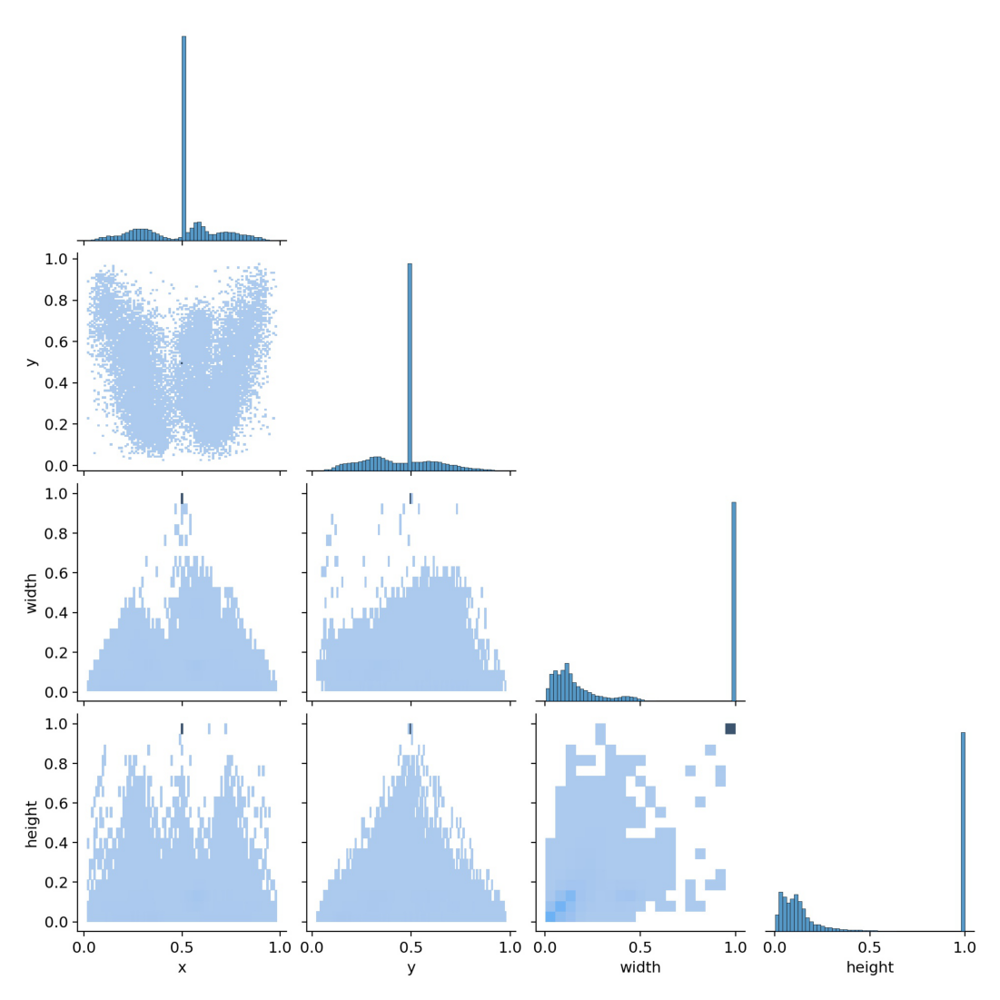

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/labels_correlogram.jpg'));

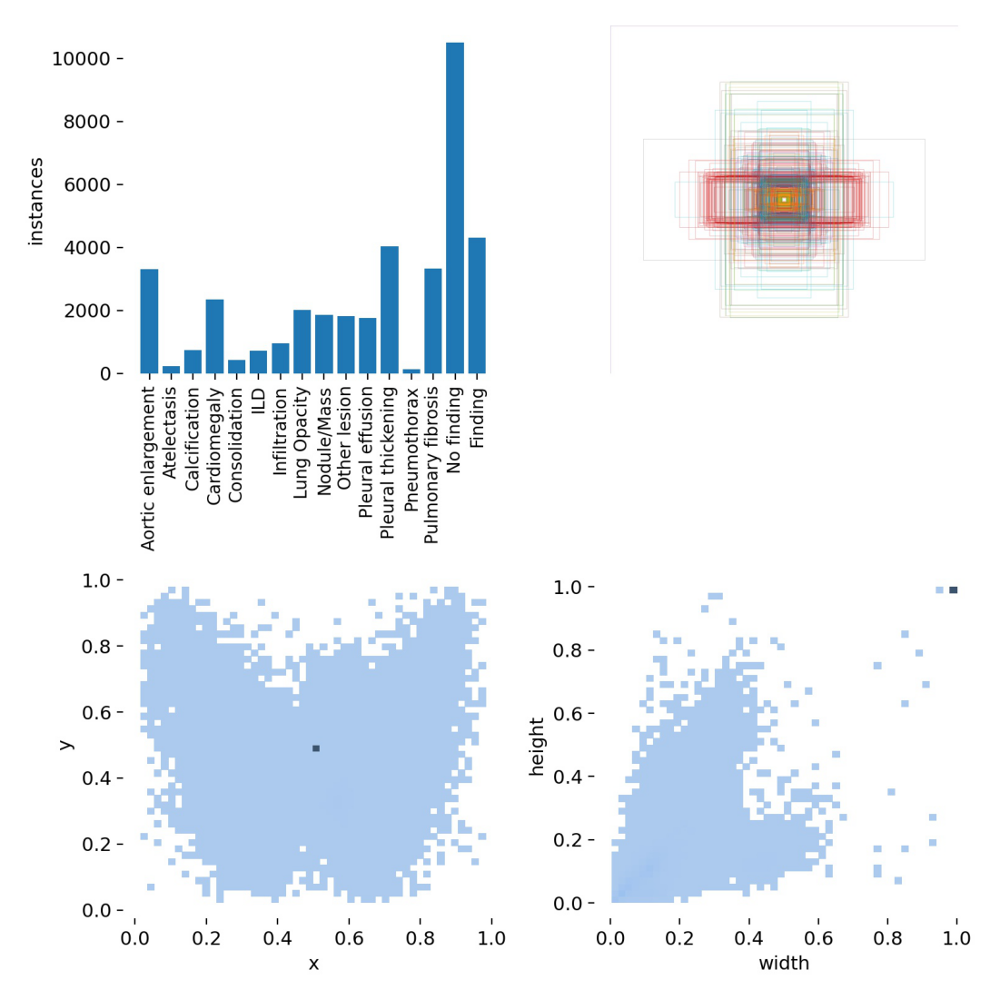

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/labels.jpg'));

# Batch Image

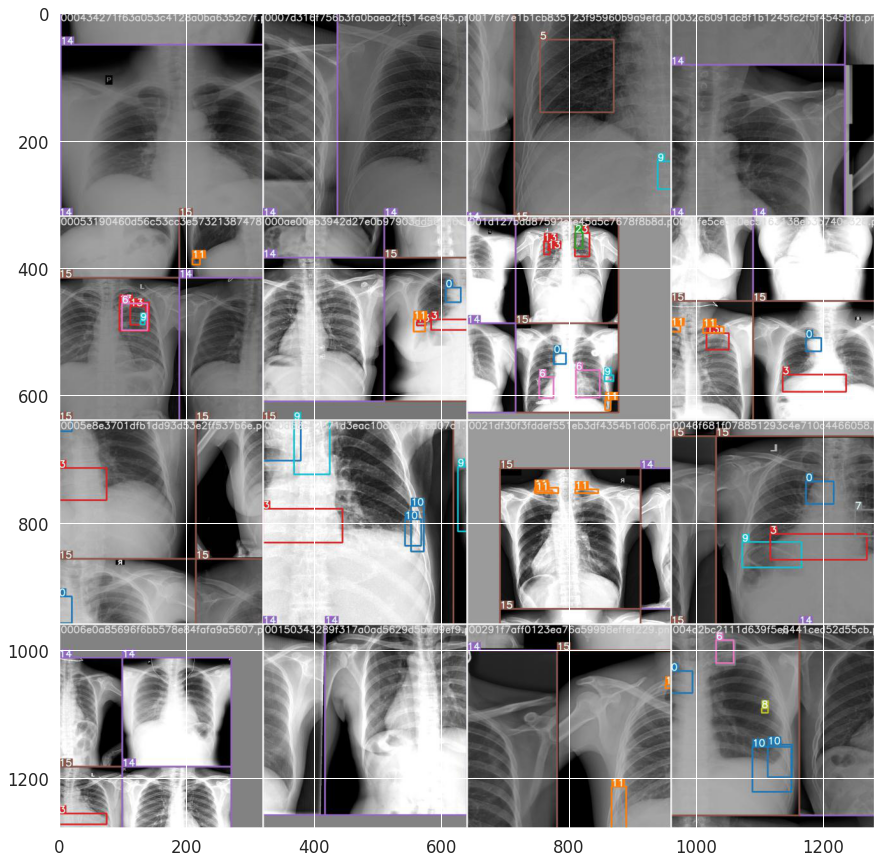

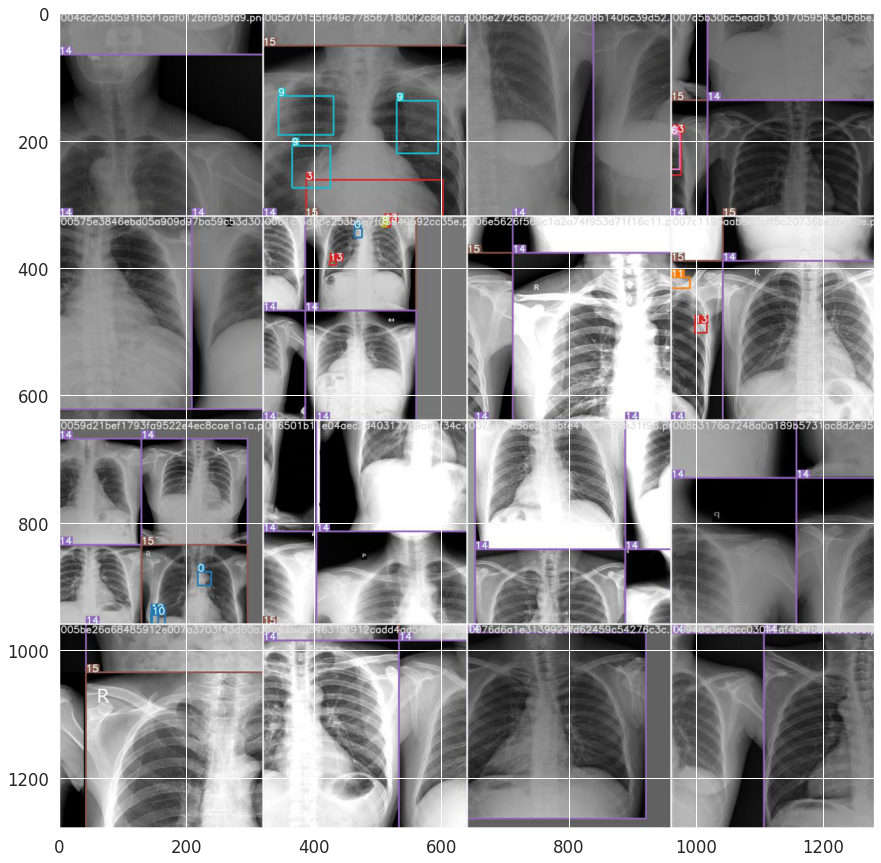

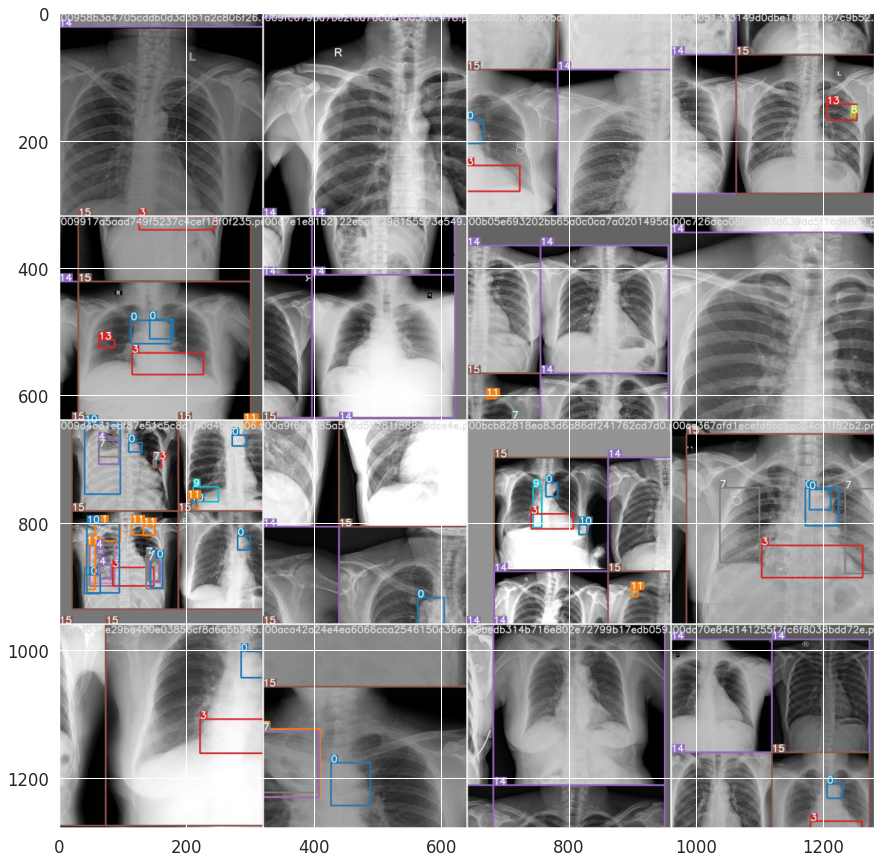

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/train_batch1.jpg'))


plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/train_batch2.jpg'))


***(Loss, Map) Vs Epoch***

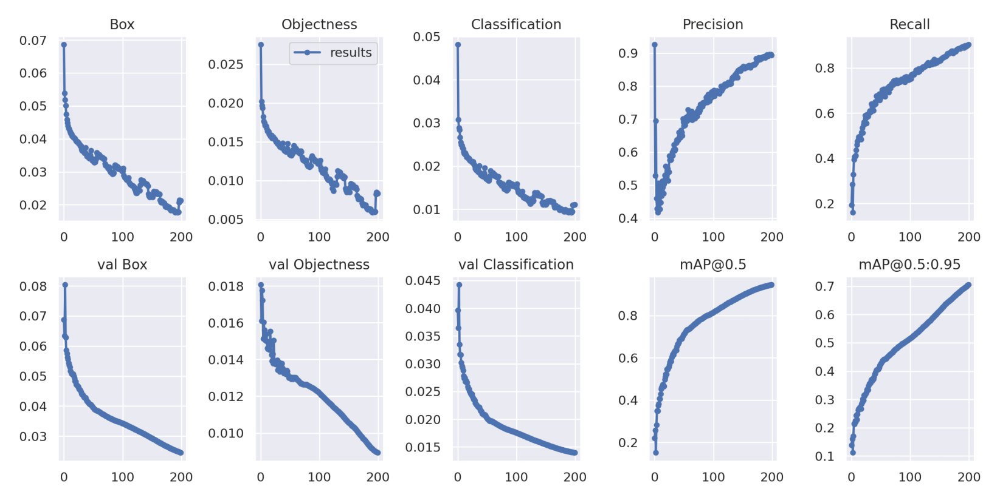

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/results.png'));

***Confusion Matrix***

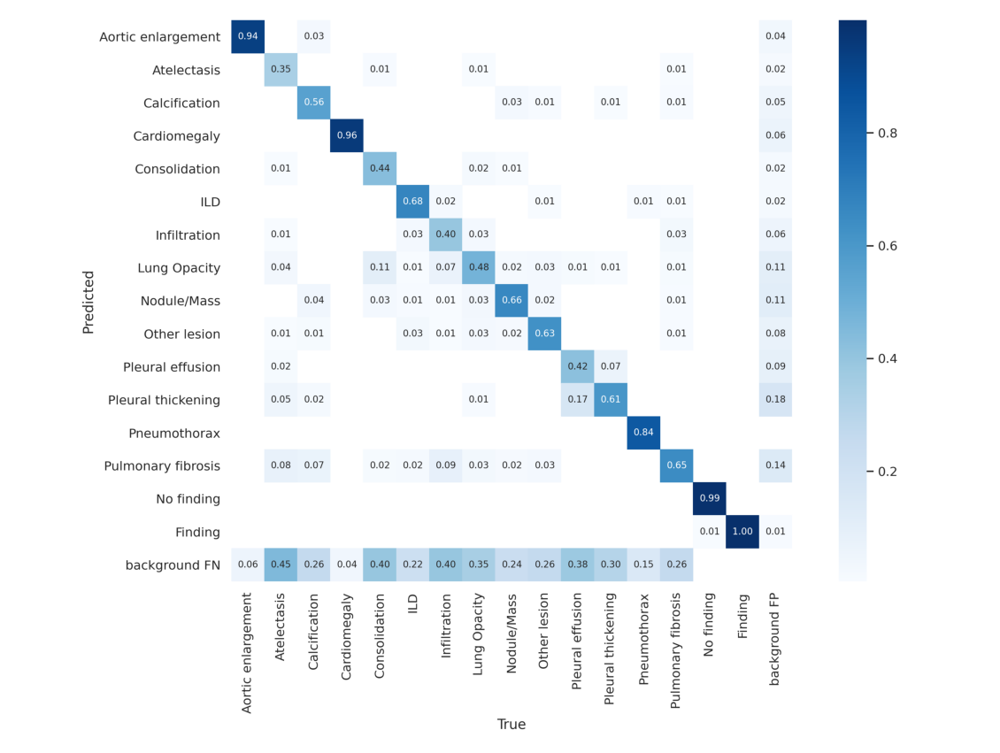

In [ ]:
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/confusion_matrix.png'));

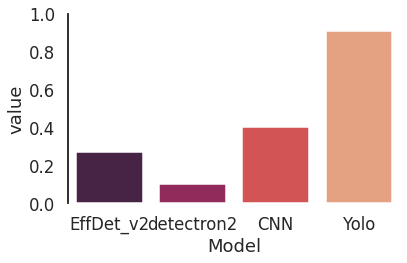

In [ ]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

sns.set_theme(style="white", context="talk")
rs = np.random.RandomState(8)


d = {'Model': ["EffDet_v2","detectron2","CNN","Yolo"], 'value': [0.271,0.1,0.4,0.91]}
df = pd.DataFrame(data=d)
# Set up the matplotlib figure
# f, (ax1) = plt.subplots(1, 1, figsize=(7, 5), sharex=True)

# Generate some sequential data
# x = np.array(["EffDet_v2","detectron2","CNN","Yolo"])
# y1 = np.array([0.271,0.1,0.4,0.91])
sns.barplot(x="Model", y="value", palette="rocket",data=df)
ax1.axhline(0, color="k", clip_on=False)
# ax1.set_ylabel("Sequential")
# Finalize the plot
sns.despine(bottom=True)
plt.ylim([0, 1])
plt.setp(f.axes, yticks=[])
plt.tight_layout(h_pad=2)

In [ ]:
df = sns.load_dataset("tips")

In [ ]:
type(df)

pandas.core.frame.DataFrame

In [ ]:
import pandas as pd

d = {'Model': ["EffDet_v2","detectron2","CNN","Yolo"], 'value': [0.271,0.1,0.4,0.91]}
df = pd.DataFrame(data=d)
df

,Model,value
0,EffDet_v2,0.271
1,detectron2,0.100
2,CNN,0.400
3,Yolo,0.910


# detect

In [ ]:
!pip install fastapi nest-asyncio pyngrok uvicorn aiofiles python-multipart

     |████████████████████████████████| 51kB 2.6MB/s 
     |████████████████████████████████| 747kB 7.2MB/s 
     |████████████████████████████████| 51kB 5.3MB/s 
     |████████████████████████████████| 61kB 5.8MB/s 
     |████████████████████████████████| 10.1MB 10.4MB/s 
     |████████████████████████████████| 61kB 7.5MB/s 
  Created wheel for pyngrok: filename=pyngrok-5.0.5-cp37-none-any.whl size=19246 sha256=2847e13f8e3a0f4df4ab1c6b099be9f6588adfb87cc0cfd37cbf9dde492430fb
  Stored in directory: /root/.cache/pip/wheels/0c/13/64/5ebbcc22eaf53fdf5766b397c1fb17c83f5775fdccf0ea1b88
  Created wheel for python-multipart: filename=python_multipart-0.0.5-cp37-none-any.whl size=31671 sha256=4e0bc91acf4b65507b21078b28a16089891da9cb2cb2cde7c8308c73a59ee372
  Stored in directory: /root/.cache/pip/wheels/f0/e6/66/14a866a3cbd6a0cabfbef91f7edf40aa03595ef6c88d6d1be4
Successfully built pyngrok python-multipart


In [ ]:
!git clone https://github.com/ThanhPhucHuynh/yolov5_xray.git

Cloning into 'yolov5_xray'...
remote: Enumerating objects: 3369, done.
remote: Counting objects: 100% (3369/3369), done.
remote: Compressing objects: 100% (1120/1120), done.
remote: Total 3369 (delta 2252), reused 3355 (delta 2238), pack-reused 0
Receiving objects: 100% (3369/3369), 28.07 MiB | 35.40 MiB/s, done.
Resolving deltas: 100% (2252/2252), done.


In [ ]:
cd yolov5_xray/

/content/yolov5_xray


In [ ]:
cd /content/drive/MyDrive/yolo200/yolov5

/content/drive/MyDrive/yolo200/yolov5


In [ ]:
import argparse
import time
from pathlib import Path

import base64
import cv2
import torch
import torch.backends.cudnn as cudnn
from numpy import random
import numpy as np

import matplotlib.pyplot as plt
from models.experimental import attempt_load
from utils.datasets import LoadStreams, LoadImages
from utils.general import check_img_size, non_max_suppression, apply_classifier, scale_coords, xyxy2xywh, \
    strip_optimizer, set_logging, increment_path
from utils.plots import plot_one_box
from utils.torch_utils import select_device, load_classifier, time_synchronized

# import torch
from typing import Optional
from fastapi import FastAPI
from pydantic import BaseModel, Field
import uvicorn
from fastapi.staticfiles import StaticFiles

from fastapi import FastAPI, File, UploadFile, Form
from fastapi.responses import HTMLResponse
# from fastapi.middleware.cors import CORSMiddleware

from starlette.middleware import Middleware
from starlette.middleware.cors import CORSMiddleware

In [ ]:
origins = [
    "http://localhost",
    "http://localhost:9999",
]
middleware = [
    Middleware(CORSMiddleware, allow_origins=origins)
]
app = FastAPI(middleware=middleware)
# app.add_middleware(GZipMiddleware)
app.add_middleware(CORSMiddleware,
                   allow_origins=['*'],
                   allow_credentials=True,
                   allow_methods=['*'],
                   allow_headers=['*'])
app.mount("/static", StaticFiles(directory="static"), name="static")
label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]
def draw_bbox(image, box, label, color):   
    thickness = 1
    # print(box,label, color)
    c1, c2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
    alpha = 0.1
    alpha_box = 0.5
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()
    # print(c1,c2)

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)[0]
    cv2.rectangle(overlay_bbox, c1, c2,color, -1)

    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (c1[0], c1[1]-7-text_height), (c1[0]+text_width+2, c1[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_box, output, 1 - alpha_box, 0, output)
    print("hah")
    print(color)
    cv2.rectangle(output, c1, c2, color, thickness)
    cv2.putText(output, label.upper(), (c1[0], c1[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1, cv2.LINE_AA)
    return output


def detect(name,save_img=False):
    # source, weights, view_img, save_txt, imgsz = opt.source, opt.weights, opt.view_img, opt.save_txt, opt.img_size
    total_e_array = []

    # weights = '/kaggle/weights/best512a100.pt'
    weights = '/content/drive/MyDrive/yolo200/yolov5/runs/train/exp/weights/best.pt'
    # weights = '/kaggle/weights/best066.pt'

    # imgsz = 512
    imgsz = 640
    save_txt = False
    source ='a/'+name
    view_img=True   
    total_e = ''
    exist_ok=True

    iou_thres = 0.5
    conf_thres = 0.15
    agnostic_nms = False
    classes = None
    save_conf = False
    print(source)
    
    webcam = source.isnumeric() or source.endswith('.txt') or source.lower().startswith(
        ('rtsp://', 'rtmp://', 'http://'))

    # Directories
    # save_dir = Path(increment_path(Path(opt.project) / opt.name, exist_ok=opt.exist_ok))  # increment run
    save_dir = Path(increment_path(Path('static') / 'exp', exist_ok=True)) 
    (save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Initialize
    set_logging()
    device = select_device('')
    # device = select_device(opt.device)
    half = device.type != 'cpu'  # half precision only supported on CUDA

    # Load model
    model = attempt_load(weights, map_location=device)  # load FP32 model
    imgsz = check_img_size(imgsz, s=model.stride.max())  # check img_size
    if half:
        model.half()  # to FP16

    # Second-stage classifier
    classify = False
    if classify:
        modelc = load_classifier(name='resnet101', n=2)  # initialize
        modelc.load_state_dict(torch.load('weights/resnet101.pt', map_location=device)['model']).to(device).eval()

    # Set Dataloader
    vid_path, vid_writer = None, None
    if webcam:
        view_img = True
        cudnn.benchmark = True  # set True to speed up constant image size inference
        dataset = LoadStreams(source, img_size=imgsz)
    else:
        save_img = True
        dataset = LoadImages(source, img_size=imgsz)

    # Get names and colors
    names = model.module.names if hasattr(model, 'module') else model.names
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]

    # Run inference
    t0 = time.time()
    img = torch.zeros((1, 3, imgsz, imgsz), device=device)  # init img
    _ = model(img.half() if half else img) if device.type != 'cpu' else None  # run once
    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device)
        img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
            img = img.unsqueeze(0)

        # Inference
        t1 = time_synchronized()
        # pred = model(img, augment=opt.augment)[0]
        pred = model(img, augment=False)[0]


        # Apply NMS
        pred = non_max_suppression(pred, conf_thres, iou_thres, classes=classes, agnostic=agnostic_nms)
        t2 = time_synchronized()

        # Apply Classifier
        if classify:
            pred = apply_classifier(pred, modelc, img, im0s)

        # Process detections
        for i, det in enumerate(pred):  # detections per image
            if webcam:  # batch_size >= 1
                p, s, im0, frame = path[i], '%g: ' % i, im0s[i].copy(), dataset.count
            else:
                p, s, im0, frame = path, '', im0s, getattr(dataset, 'frame', 0)

            p = Path(p)  # to Path
            save_path = str(save_dir / p.name)  # img.jpg
            txt_path = str(save_dir / 'labels' / p.stem) + ('' if dataset.mode == 'image' else f'_{frame}')  # img.txt
            s += '%gx%g ' % img.shape[2:]  # print string
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh
            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

                # Print results
                for c in det[:, -1].unique():
                    n = (det[:, -1] == c).sum()  # detections per class
                    s += f'{n} {names[int(c)]}s, '  # add to string

                # Write results
                for *xyxy, conf, cls in reversed(det):
                    total_e += f'{names[int(cls)]} {conf:.2f},'
                    acc = f'{conf:.2f}'
                    label_name = f'{names[int(cls)]}'
                    local = list(np.int_(xyxy))
                    listToStrLocal = ' '.join([str(elem) for elem in local]) 
                    # print("d")
                    # print(acc)
                    label = f'{names[int(cls)]} {conf:.2f}'
                    # plot_one_box(xyxy, im0, label=label, color=colors[int(cls)], line_thickness=2)
                    # print(list(np.int_(xyxy)))
                    print(label_name)  
                    color = colors[int(cls)]
                    print(label_name != 'Finding' and label_name != 'No finding')
                    if label_name != 'Finding' and label_name != 'No finding':
                        im0 =  draw_bbox(im0, xyxy, label=label, color= color)
                    else:
                        print("A")
                    total_e_array.append({'name': names[int(cls)],'conf': acc, 'local':listToStrLocal,'color': color })
                    # print(color)

            # Print time (inference + NMS)
            print(f'{s}Done. ({t2 - t1:.3f}s)')
            print(s)
            result = s
            print(save_path)
            # Stream results
            # if view_img:
            #     cv2.imshow(str(p), im0)
            #     if cv2.waitKey(1) == ord('q'):  # q to quit
            #         raise StopIteration

            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'image':
                    cv2.imwrite(save_path, im0)
                else:  # 'video'
                    if vid_path != save_path:  # new video
                        vid_path = save_path
                        if isinstance(vid_writer, cv2.VideoWriter):
                            vid_writer.release()  # release previous video writer

                        fourcc = 'mp4v'  # output video codec
                        fps = vid_cap.get(cv2.CAP_PROP_FPS)
                        w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                        h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                        vid_writer = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*fourcc), fps, (w, h))
                    vid_writer.write(im0)

    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        print(f"Results saved to {save_dir}{s}")

    print(f'Done. ({time.time() - t0:.3f}s)')
    print(total_e)
    return {
            "result":total_e,
            "path":  save_path,
            "total_e_array": total_e_array
            }

@app.get("/")
def read_root():
    return {"Hello": "World"}


# @app.post("/inference")
# def inference_with_path(imgs: Image):
#     return results_to_json(model(imgs.img_list))
opt = []
@app.get("/test")
def read_root():
    # source, weights, view_img, save_txt, imgsz = opt.source, opt.weights, opt.view_img, opt.save_txt, opt.img_size
    # opt = parser.parse_args()
    print(opt)
    
    return {"result": detect()}

@app.post("/files/")
async def create_file(files: bytes = File(...)):
    return {"file_size": len(files)}

# @app.post("/files/")
# async def create_file(
#     files: bytes = File(...), fileb: UploadFile = File(...), token: str = Form(...)
# ):
#     return {
#         "file_size": len(file),
#         "token": token,
#         "fileb_content_type": fileb.content_type,
#     }

@app.post("/uploadfiles/")
async def create_upload_file(files: UploadFile = File(...)):
    image = await files.read();
    # print(image)
    print(files.file)
    
    file_location = f"a/{files.filename}"
    with open(file_location, "wb+") as file_object:
        file_object.write(image)
    print({"info": f"file '{files.filename}' saved at '{file_location}'"})

    # return {"result": detect(name = files.filename)} 
    data = detect(name = files.filename)
    content = f"""
<body>
    <h1>{data['result']}</h1>
    <img src="http://localhost:9999/{data['path']}" alt="Girl in a jacket" width="500" height="600">
</body>
    """
    return HTMLResponse(content=content)

@app.post("/uploadfilesjs/")
async def create_upload_file(files: UploadFile = File(...)):
    image = await files.read();
    print(files.file) 
    file_location = f"a/{files.filename}"
    with open(file_location, "wb+") as file_object:
        file_object.write(image)
    print({"info": f"file '{files.filename}' saved at '{file_location}'"})
    return {"result": detect(name = files.filename)} 
    # data = detect(name = files.filename)
    # return 
@app.post("/predict/")
async def predict(files: UploadFile = File(...)):
    extension = files.filename.split(".")[-1] in ("jpg", "jpeg", "png")
    if not extension:
        return "Image must be jpg or png format!"
    image = read_imagefile(await files.read())
    cv2.imshow("sad",image)
    return "have"


@app.get("/haha")
async def web():
    content = """
<body>
<form action="/files/" enctype="multipart/form-data" method="post">
<input name="files" type="file">
<input type="submit">
</form>
<form action="/uploadfiles/" enctype="multipart/form-data" method="post">
<input name="files" type="file">
<input type="submit">
</form>
</body>
    """
    return HTMLResponse(content=content)


In [ ]:
pwd 

'/content'

In [ ]:
import matplotlib
matplotlib.use('TKAgg')

In [ ]:
%matplotlib inline
# **matplotlib.use('TKAgg')**
import nest_asyncio
from pyngrok import ngrok
import uvicorn

ngrok_tunnel = ngrok.connect(9999)
print('Public URL:', ngrok_tunnel.public_url)
nest_asyncio.apply()
uvicorn.run(app, port=9999)

INFO:     Started server process [58]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://127.0.0.1:9999 (Press CTRL+C to quit)


Public URL: http://36d260233270.ngrok.io
INFO:     115.74.210.37:0 - "GET / HTTP/1.1" 200 OK
INFO:     115.74.210.37:0 - "GET /robots.txt HTTP/1.1" 404 Not Found
INFO:     115.74.210.37:0 - "GET /favicon.ico HTTP/1.1" 404 Not Found
INFO:     115.74.210.37:0 - "OPTIONS /uploadfilesjs/ HTTP/1.1" 200 OK
{'info': "file '45004be2-9e27-4a79-992a-7620c6710445.png' saved at 'a/45004be2-9e27-4a79-992a-7620c6710445.png'"}
a/45004be2-9e27-4a79-992a-7620c6710445.png


YOLOv5 🚀 2021-3-29 torch 1.8.1+cu101 CPU



Fusing layers... 


Model Summary: 476 layers, 87299629 parameters, 0 gradients


image 1/1 /content/drive/MyDrive/yolo200/yolov5/a/45004be2-9e27-4a79-992a-7620c6710445.png: Aortic enlargement
True
hah
[194, 138, 171]
Cardiomegaly
True
hah
[73, 83, 158]
Finding
False
A
640x544 1 Aortic enlargements, 1 Cardiomegalys, 1 Findings, Done. (4.168s)
640x544 1 Aortic enlargements, 1 Cardiomegalys, 1 Findings, 
static/exp/45004be2-9e27-4a79-992a-7620c6710445.png
Results saved to static/exp
Done. (6.011s)
Aortic enlargement 0.87,Cardiomegaly 0.92,Finding 0.99,
INFO:     115.74.210.37:0 - "POST /uploadfilesjs/ HTTP/1.1" 200 OK
INFO:     115.74.210.37:0 - "GET /static/exp/45004be2-9e27-4a79-992a-7620c6710445.png HTTP/1.1" 200 OK


t=2021-05-27T10:02:00+0000 lvl=info msg="received stop request" obj=app stopReq="{err:<nil> restart:false}"
t=2021-05-27T10:02:00+0000 lvl=info msg="session closing" obj=tunnels.session err=nil
t=2021-05-27T10:02:00+0000 lvl=info msg="accept failed" obj=csess id=b6a88cc909ab err="reconnecting session closed"
INFO:     Shutting down
Shutting down
INFO:     Waiting for application shutdown.
Waiting for application shutdown.
INFO:     Application shutdown complete.
Application shutdown complete.
INFO:     Finished server process [58]
Finished server process [58]


In [ ]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

In [ ]:
# !wget -nc https://raw.githubusercontent.com/brpy/colab-pdf/master/colab_pdf.py
from colab_pdf import colab_pdf
colab_pdf('a.ipynb')

# bold text

In [ ]:
train_df=pd.read_csv('/content/vinbigdata/train.csv')
train_df.shape

(67914, 8)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
 
df_train = pd.read_csv('/content/vinbigdata/train.csv')
train, val = train_test_split(df_train, test_size=0.2)
 
train_images_lst = train.groupby('image_id').apply(list).reset_index()['image_id'].tolist()
val_images_lst = val.groupby('image_id').apply(list).reset_index()['image_id'].tolist()
 

In [ ]:
len(train_images_lst), len(val_images_lst)

(14910, 8557)

In [ ]:
a = []
a.extend(train_images_lst)
a.extend(val_images_lst)
len(a)

23467

In [ ]:
len(list(set(a)))

15000

In [ ]:
class_sample_counts_train=train.groupby(['class_name','class_id']).size().reset_index().rename(columns={0:'count'})
class_sample_counts_train.sort_values(by='class_id',inplace=True)
class_sample_counts_train.reset_index(drop=True)

,class_name,class_id,count
0,Aortic enlargement,0,5745
1,Atelectasis,1,218
2,Calcification,2,777
3,Cardiomegaly,3,4347
4,Consolidation,4,445
5,ILD,5,814
6,Infiltration,6,1007
7,Lung Opacity,7,1973
8,Nodule/Mass,8,2070
9,Other lesion,9,1759


In [ ]:
class_sample_counts_val=val.groupby(['class_name','class_id']).size().reset_index().rename(columns={0:'count'})
class_sample_counts_val.sort_values(by='class_id',inplace=True)
class_sample_counts_val.reset_index(drop=True)

,class_name,class_id,count
0,Aortic enlargement,0,1417
1,Atelectasis,1,61
2,Calcification,2,183
3,Cardiomegaly,3,1080
4,Consolidation,4,111
5,ILD,5,186
6,Infiltration,6,240
7,Lung Opacity,7,510
8,Nodule/Mass,8,510
9,Other lesion,9,444


*italicized text*

In [ ]:
train_df=pd.read_csv('/content/vinbigdata/train.csv')
train_df.shape

(67914, 8)

In [ ]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)
train_df

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0
...,...,...,...,...,...,...,...,...
36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0
36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0
36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0
36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0


In [ ]:
len(list(set(train_df['image_id'].tolist())))

4394

In [ ]:
fold = 4
from sklearn.model_selection import GroupKFold

In [ ]:
gkf  = GroupKFold(n_splits = 5)
train_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold
train_df

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,4
...,...,...,...,...,...,...,...,...,...
36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0,0
36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0,4
36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0,4
36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0,2


In [ ]:
train_df_abnormal = train_df[train_df.fold==3].reset_index(drop = True)

train_df1=train_df_abnormal[train_df_abnormal['image_id']==train_df_abnormal.image_id[0]]

In [ ]:
train_df1

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,3
560,9a5094b2563a1ef3ff50dc5c7ff71345,Pleural effusion,10,R9,1789.0,1729.0,1875.0,1992.0,3
2640,9a5094b2563a1ef3ff50dc5c7ff71345,Pleural thickening,11,R9,1789.0,1729.0,1875.0,1992.0,3
2764,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R9,692.0,1375.0,1657.0,1799.0,3
4559,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R8,689.0,1313.0,1666.0,1763.0,3
5676,9a5094b2563a1ef3ff50dc5c7ff71345,Aortic enlargement,0,R9,1052.0,715.0,1299.0,966.0,3


In [ ]:
train_files = []
val_files   = []
val_files += list(train_df[train_df.fold==fold].image_id.unique())
train_files += list(train_df[train_df.fold!=fold].image_id.unique())
len(train_files), len(val_files)

(3515, 879)

In [ ]:
val = train_df[train_df.fold==fold]
train = train_df[train_df.fold!=fold]
train.shape, val.shape

((28877, 9), (7219, 9))

In [ ]:
class_sample_counts_train=train.groupby(['class_name','class_id']).size().reset_index().rename(columns={0:'count'})
class_sample_counts_train.sort_values(by='class_id',inplace=True)
class_sample_counts_train.reset_index(drop=True)

,class_name,class_id,count
0,Aortic enlargement,0,5777
1,Atelectasis,1,228
2,Calcification,2,749
3,Cardiomegaly,3,4347
4,Consolidation,4,442
5,ILD,5,815
6,Infiltration,6,958
7,Lung Opacity,7,1979
8,Nodule/Mass,8,2138
9,Other lesion,9,1786


In [ ]:
class_sample_counts_val=val.groupby(['class_name','class_id']).size().reset_index().rename(columns={0:'count'})
class_sample_counts_val.sort_values(by='class_id',inplace=True)
class_sample_counts_val.reset_index(drop=True)

,class_name,class_id,count
0,Aortic enlargement,0,1385
1,Atelectasis,1,51
2,Calcification,2,211
3,Cardiomegaly,3,1080
4,Consolidation,4,114
5,ILD,5,185
6,Infiltration,6,289
7,Lung Opacity,7,504
8,Nodule/Mass,8,442
9,Other lesion,9,417
